# EDA FINAL

## Ici se touvent toutes les analyses et le nettoyage des data

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from datetime import datetime
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler, FunctionTransformer

Pour debuter, analysons chaque dataset afin de choisir les eventuelles variables qui constitueront la dataset finale

## Fonctions essentielles

In [13]:
#fonction pour decrire la data : my_description()
def my_description(data):
    print(f'''Voici une breve description de la data : \n
{data.describe()}\n

Valeurs manquantes : \n
{data.isna().sum()}\n

Valeurs dupliquees : \n
{data.duplicated().sum()}\n

Voila la data en bref : \n
{data.head(5)}

Voila les colonnes : \n
{data.columns}
    ''')

## REMPLISSAGE DES NAN

In [14]:
my_df = pd.read_csv('../dataset_final/togo_dataset_final_propre.csv')

In [15]:
my_df.head()

,demande_id,region,prefecture,commune,quartier_x,type_document,categorie_document,nombre_demandes,delai_traitement_jours,taux_rejet,...,revenu_moyen_fcfa,annee,mois,nombre_demandes_mensuel,delai_moyen_jours,taux_rejet_moyen,delai_effectif,nombre_rejete,longueur_km,temps_parcours_heures
0,D001,Centrale,Sotouboua,Sotouboua,Nyékonakpoé,Carte d'identité,Identité,168.0,1.0,0.00,...,218170.0,2023.0,1.0,950.0,18.40,0.070,17.800000,50.0,280.0,2.233333
1,D001,Centrale,Sotouboua,Sotouboua,Nyékonakpoé,Carte d'identité,Identité,168.0,1.0,0.00,...,218170.0,2023.0,1.0,950.0,18.40,0.070,22.083333,97.0,280.0,2.233333
2,D002,Kara,Binah,Pagouda,Hôpital,Carte d'identité,Identité,17.0,22.0,0.09,...,138235.0,2024.0,1.0,760.0,18.66,0.058,26.000000,75.0,228.0,2.200000
3,D002,Kara,Binah,Pagouda,Hôpital,Carte d'identité,Identité,17.0,22.0,0.09,...,138235.0,2024.0,1.0,760.0,18.66,0.058,20.000000,42.0,228.0,2.200000
4,D003,Plateaux,Ogou,Atakpamé,Bè,Certificat de nationalité,Identité,104.0,4.0,0.08,...,208908.0,2023.0,2.2,1272.0,20.56,0.068,17.583333,56.2,455.0,2.700000


In [16]:
my_description(my_df)

Voici une breve description de la data : 

       nombre_demandes  delai_traitement_jours   taux_rejet  age_demandeur  \
count       1296.00000             1296.000000  1296.000000    1296.000000   
mean         106.91821               22.582562     0.073511      54.144290   
std           55.92460               13.104957     0.042701      20.888341   
min           10.00000                1.000000     0.000000      18.000000   
25%           56.00000               11.000000     0.040000      37.000000   
50%          109.50000               22.000000     0.070000      55.000000   
75%          157.00000               34.000000     0.110000      71.000000   
max          200.00000               45.000000     0.150000      90.000000   

          latitude    longitude  personnel_capacite_jour  nombre_guichets  \
count  1296.000000  1296.000000              1296.000000      1296.000000   
mean      8.457473     1.013326               187.758951         7.745216   
std       1.272740     

In [17]:
(my_df['statut_centre'] != 'Actif').sum()


np.int64(0)

Tous les centres sont actifs donc le statut_centre est une variable a ne pas prendre en compte

<Axes: >

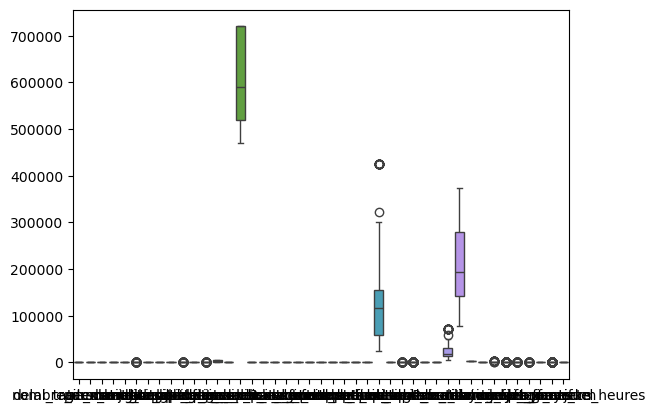

In [18]:
sns.boxplot(my_df)

# Analyse univariee et bivariee

In [19]:
corr = my_df.corr(numeric_only=True)

<Axes: >

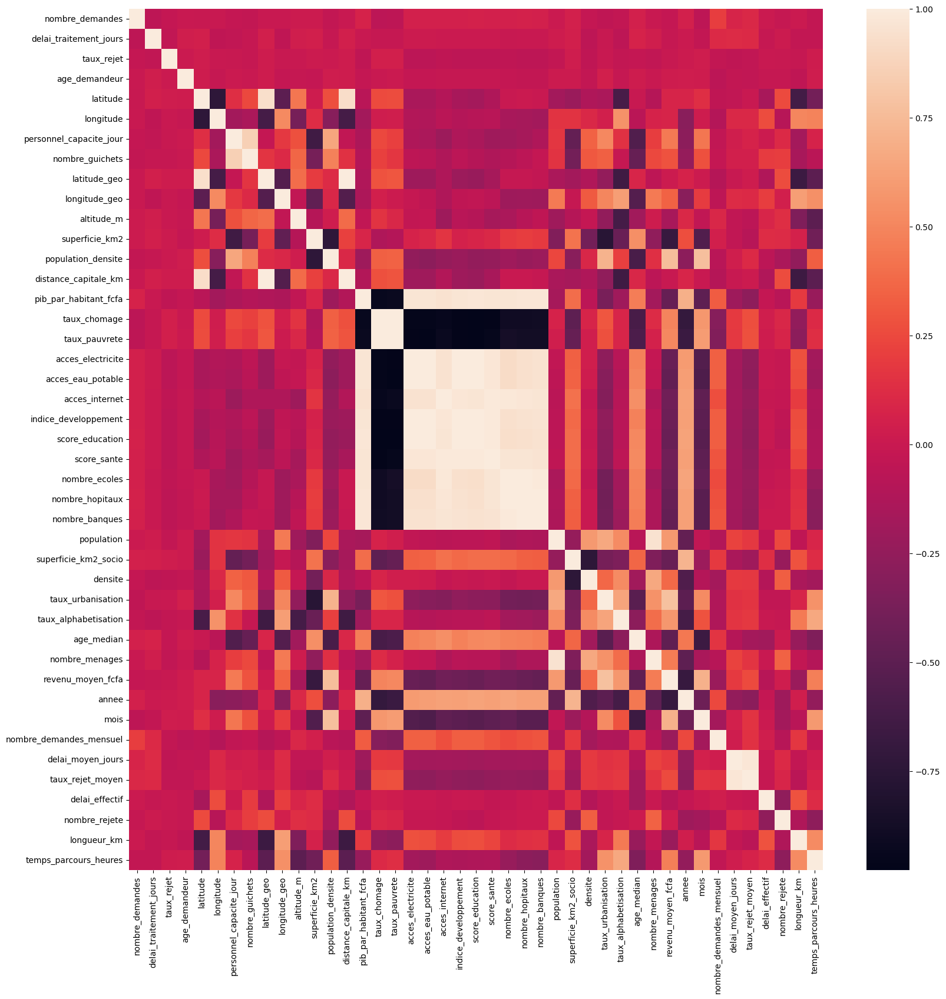

In [20]:
plt.figure(figsize=(19,19))
sns.heatmap(corr)

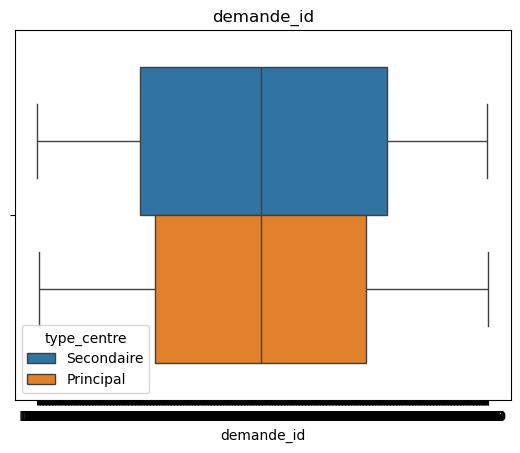

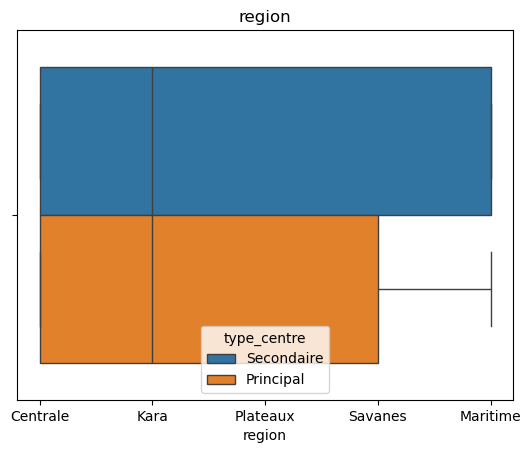

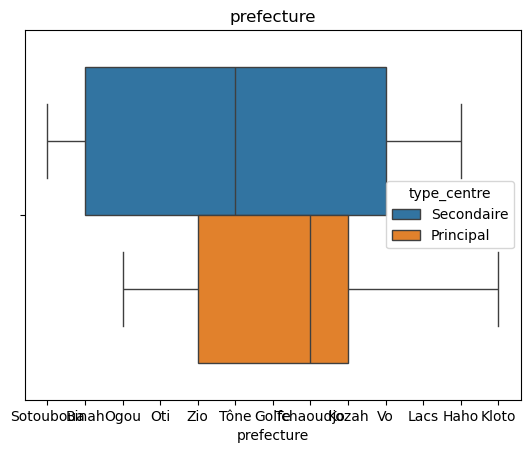

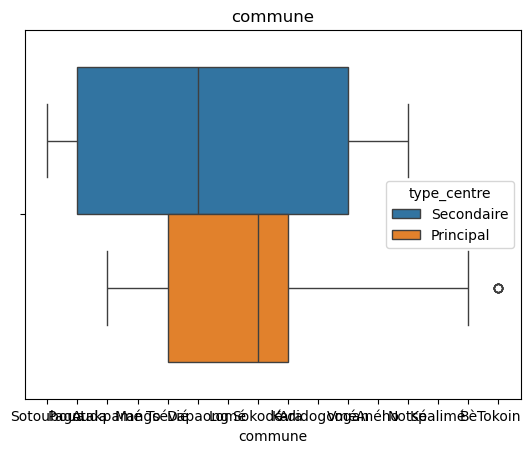

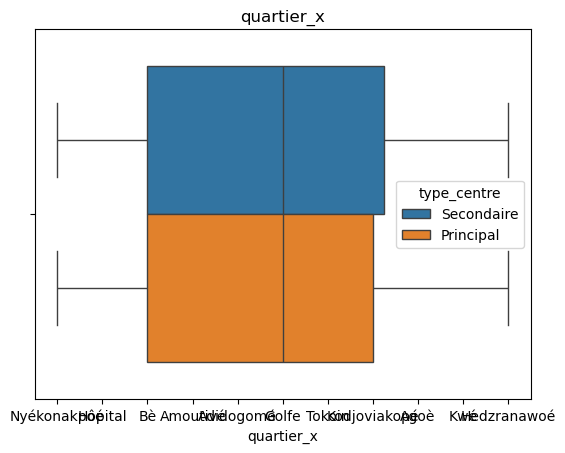

...

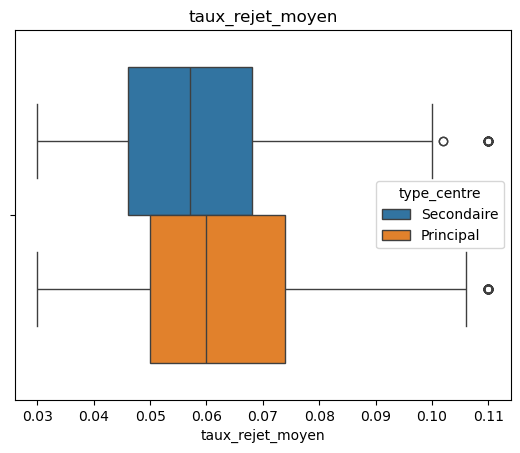

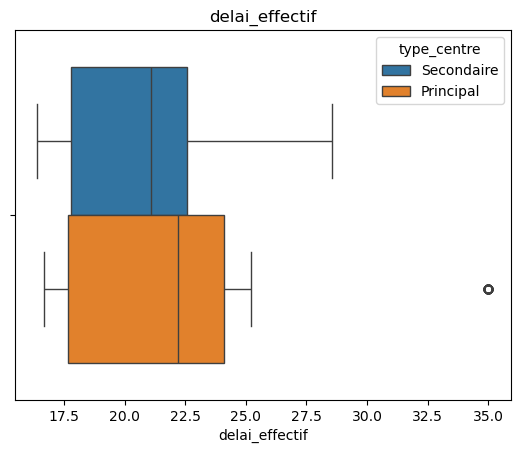

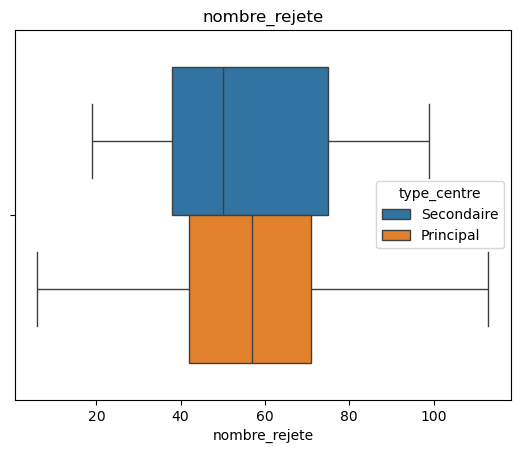

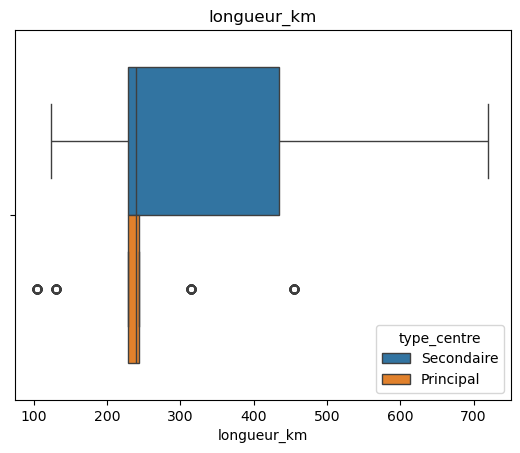

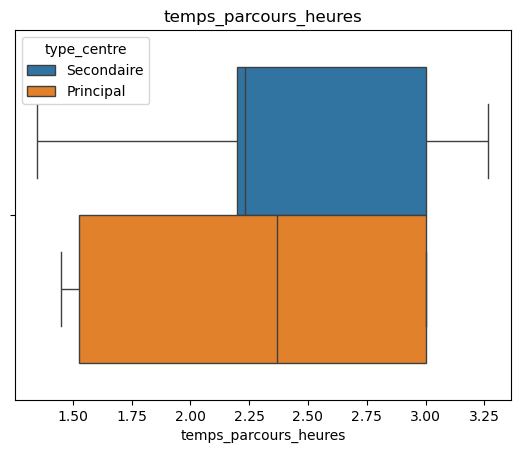

In [21]:
for col in my_df.columns:
    plt.title(col)
    sns.boxplot(data=my_df,x=my_df[col], hue = 'type_centre')
    plt.show()

In [22]:
sns.pairplot(data=my_df, diag_kws={'color': 'blue'})
plt.show()